In [1]:
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
# This file contains all the main external libs we'll use
import fastai
from fastai.imports import *
from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *

import torch.nn as nn 
import torch 
import numpy 
%matplotlib inline

from torch.autograd import Variable
from torchvision import models
from fastai import conv_learner
import numpy as np
import matplotlib.pyplot as plt

In [3]:
PATH = "../data_segments/data_balanced_duplicate_sample/"
sz=256
arch=resnet50

In [4]:
torch.cuda.is_available()

True

In [5]:
torch.backends.cudnn.enabled

True

In [6]:
os.listdir(PATH)

['models', 'tmp', 'valid', 'train']

In [7]:
files = os.listdir(f'{PATH}valid/Celiac')[:5]
files

['C16-77_02_3330_999_1.jpg',
 'C06-27_02_5994_4662_0.jpg',
 'C06-28_02_13653_666_1.jpg',
 'C06-28_02_13320_1332_1.jpg',
 'C06-32_02_5994_2664_0.jpg']

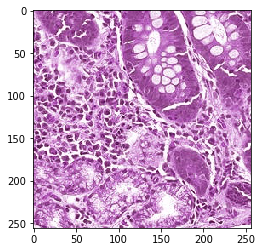

In [8]:
img = plt.imread(f'{PATH}valid/Celiac/{files[4]}')
plt.imshow(img);

In [9]:
arch=resnet50
data = ImageClassifierData.from_paths(PATH, tfms=tfms_from_model(arch, sz))
learn = ConvLearner.pretrained(arch, data, precompute=True)

In [10]:
# Using predefined augmentations transforms_top_down
tfms = tfms_from_model(resnet50, sz, aug_tfms=transforms_top_down, max_zoom=1.1)

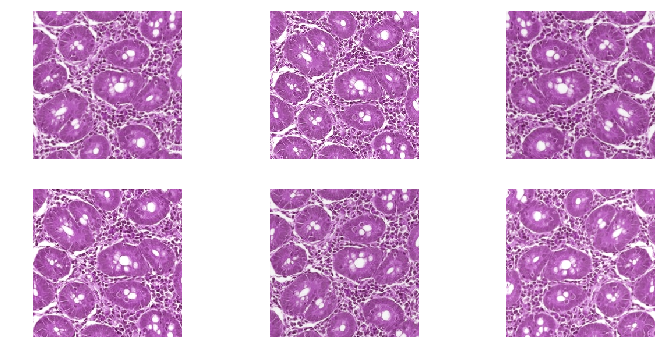

In [11]:
# Visualising the augmentation
def get_augs():
    data = ImageClassifierData.from_paths(PATH, bs=2, tfms=tfms, num_workers=1)
    x,_ = next(iter(data.aug_dl))
    return data.trn_ds.denorm(x)[1]
ims = np.stack([get_augs() for i in range(6)])
plots(ims, rows=2)

In [12]:
# Initializing the data with augmentation and learn method
data = ImageClassifierData.from_paths(PATH, tfms=tfms)
learn = ConvLearner.pretrained(arch, data, precompute=False)
learn.precompute = False

## Unfreezing layers and using Differential learning rates

In [13]:
# Unfreeze all layers for training
learn.unfreeze()

In [23]:
lrf=learn.lr_find()

 70%|███████   | 5139/7308 [46:52<19:08,  1.89it/s, loss=1.05]   

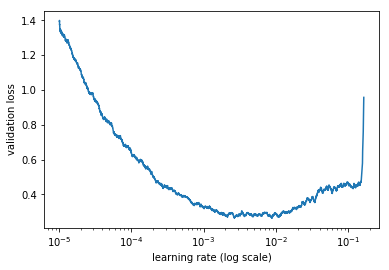

In [24]:
learn.sched.plot()

In [14]:
learn.load('256_all_resnet50_duplicates_staintools')

In [15]:
learn.precompute = False
learn.predict()

array([[ -0.07257,  -8.9605 ,  -2.66109],
       [ -0.00001, -13.56015, -11.8156 ],
       [ -0.00067, -10.93428,  -7.33574],
       ...,
       [ -6.19549, -12.80837,  -0.00204],
       [ -5.62627,  -7.45013,  -0.00419],
       [ -3.05599,  -9.76478,  -0.04828]], dtype=float32)

In [16]:
model = learn.model
model

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1

In [17]:
# Some Helper functions
from PIL import Image
def image_loader(path, expand_dim=False):
    img = Image.open(path)
#     img = img.resize((256, 256))
    img = np.array(img, dtype=np.float32)
    img = np.einsum('ijk->kij', img)
    if expand_dim:
        img = img[None]
    # convert to torch 
    img = torch.from_numpy(img)
    return img

In [18]:
def return_sequential(layer_num, model):
    return nn.Sequential(
            *list(model.children())[:layer_num]
        )

class get_activation_layer(nn.Module):
    def __init__(self, model, total_layers):
        super().__init__()
        self.model = model
        self.total_layers = total_layers
        self.layer_models = []
        for i in range(self.total_layers):
             self.layer_models.append(return_sequential(i, self.model))
    def forward(self, x):
        self.outputs = []
        for i in range(self.total_layers):
            self.outputs.append(self.layer_models[i](x))
        return self.outputs

In [19]:
tmp_model = get_activation_layer(model, 16)

In [39]:
!mkdir ../layers_vis

mkdir: cannot create directory ‘../layers_vis’: File exists


In [61]:
def visulaize_layers(outputs):
    for index, layer in enumerate(outputs):
        features = layer.data
        size_plot = features.shape[1]
        if size_plot % 2 != 0:
            size_plot += 1
        original_size = np.int(np.ceil(np.sqrt(size_plot)))
        f, axarr = plt.subplots(original_size + 1, original_size + 1, figsize=(40,40))
        i, j = 0,0
        counter = 1
        for blocks in features:
            for block in blocks:
                counter += 1
                x = block.cpu().numpy()
                if counter % original_size == 0:
                    i += 1
                    j = 0 

                axarr[i,j].imshow(x)
                j += 1
        counter = 0
        print(f'layer {index} done')
        f.savefig(f'../layers_vis/output{index}.jpg')
        print('image generated')
        if (index == 10):
            break

In [62]:
img_path = f'{PATH}valid/Celiac/C06-27_02_5994_4662_0.jpg'
i = image_loader(f'{PATH}valid/Celiac/C06-27_02_5994_4662_0.jpg', expand_dim=True)
i = i.cuda()

layer_outputs = tmp_model(Variable(i))

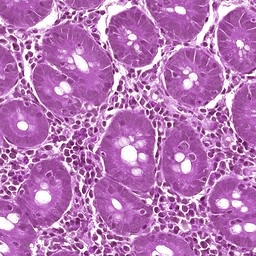

In [63]:
from IPython.display import Image as I
I(img_path)

layer 0 done
image generated
layer 1 done
image generated
layer 2 done
image generated
layer 3 done
image generated
layer 4 done
image generated
layer 5 done
image generated
layer 6 done
image generated
layer 7 done
image generated
layer 8 done
image generated
layer 9 done
image generated


TypeError: Invalid dimensions for image data

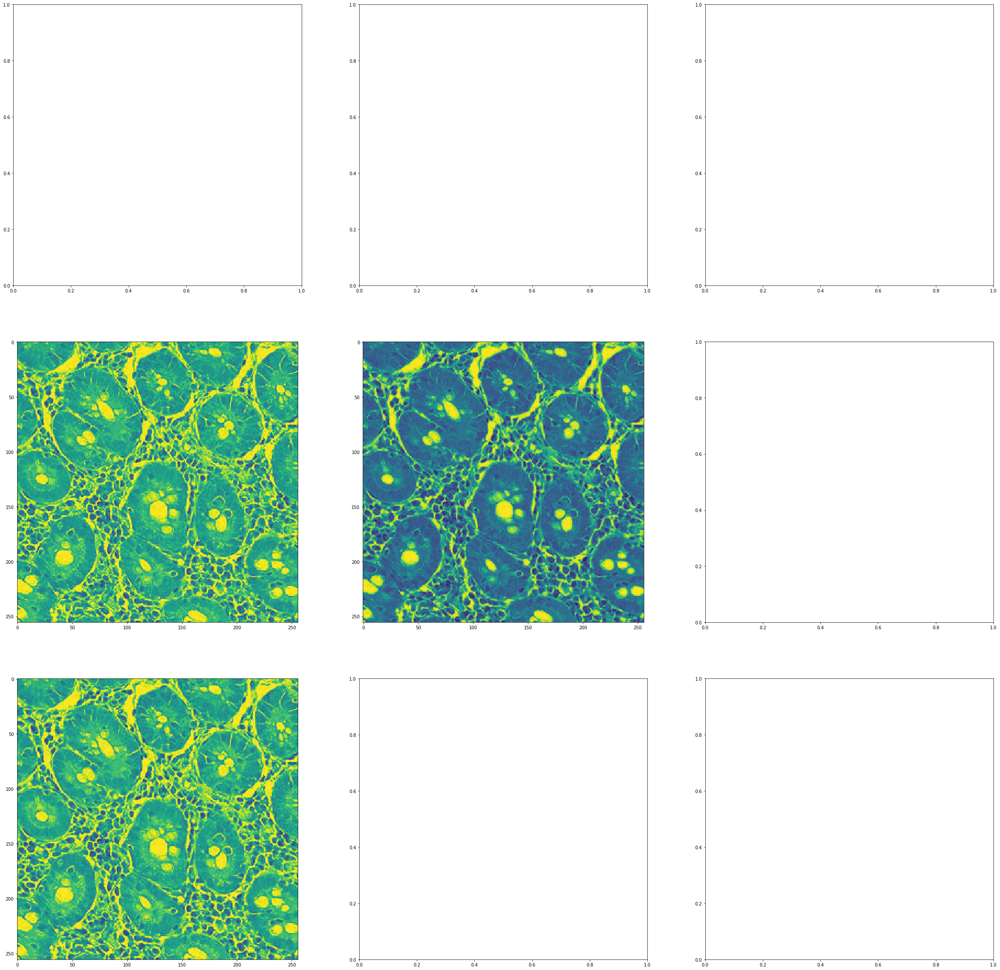

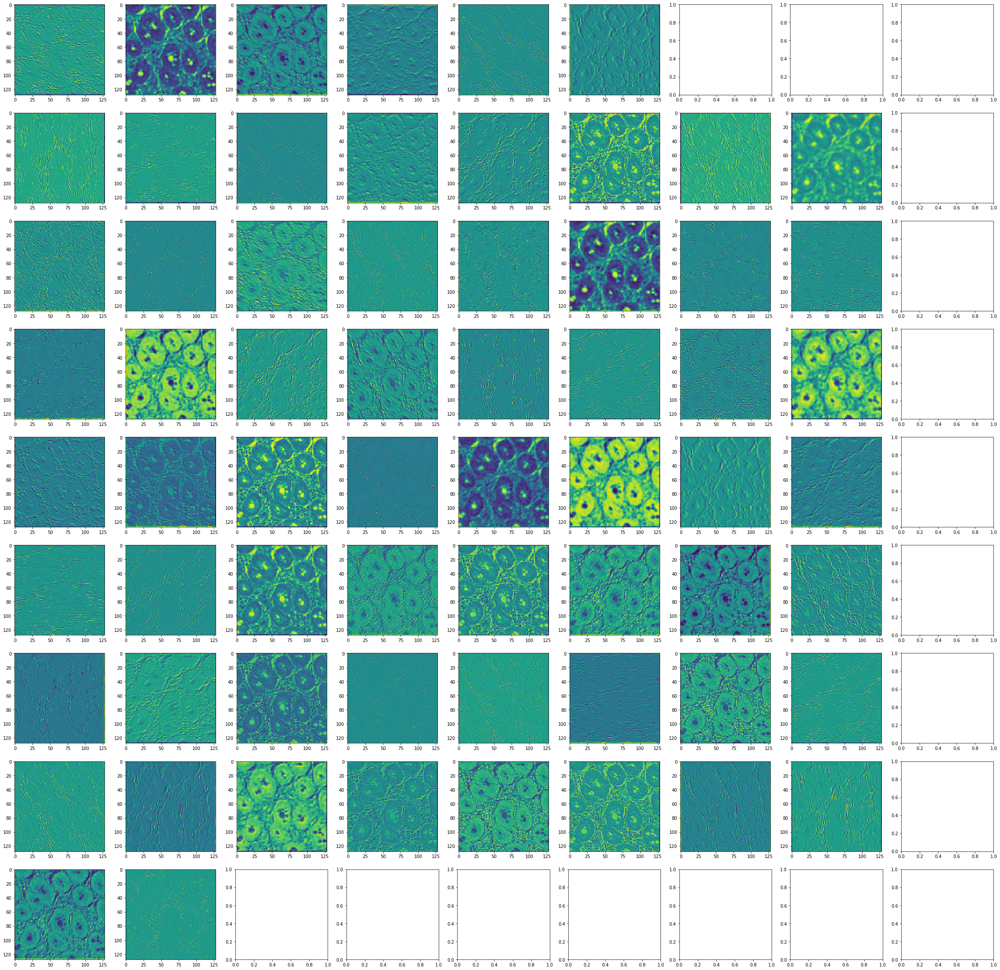

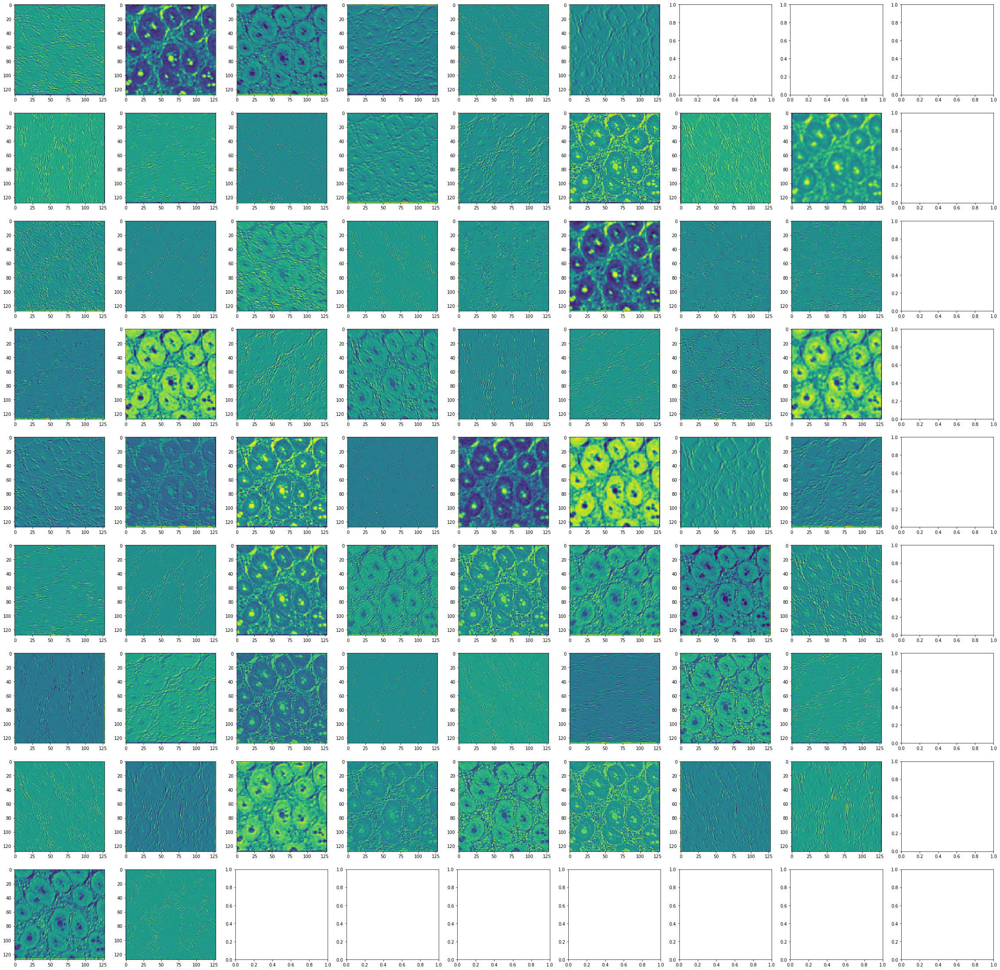

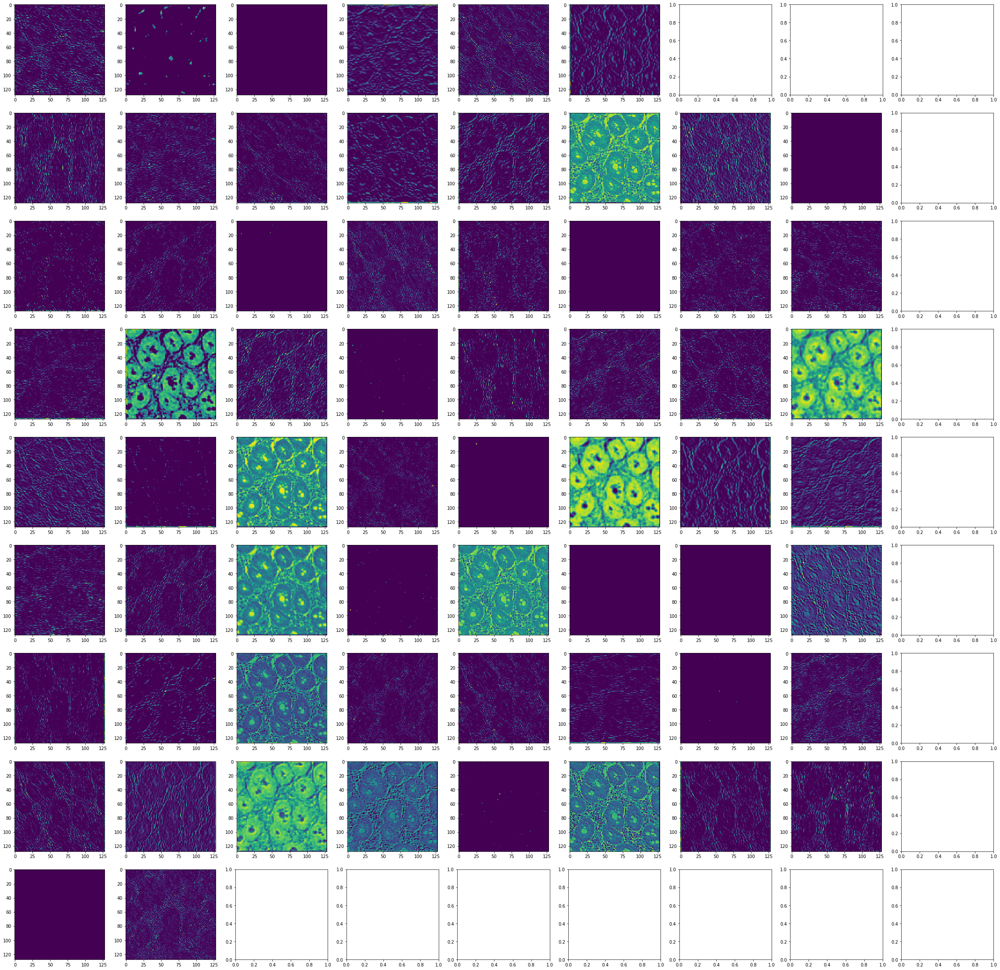

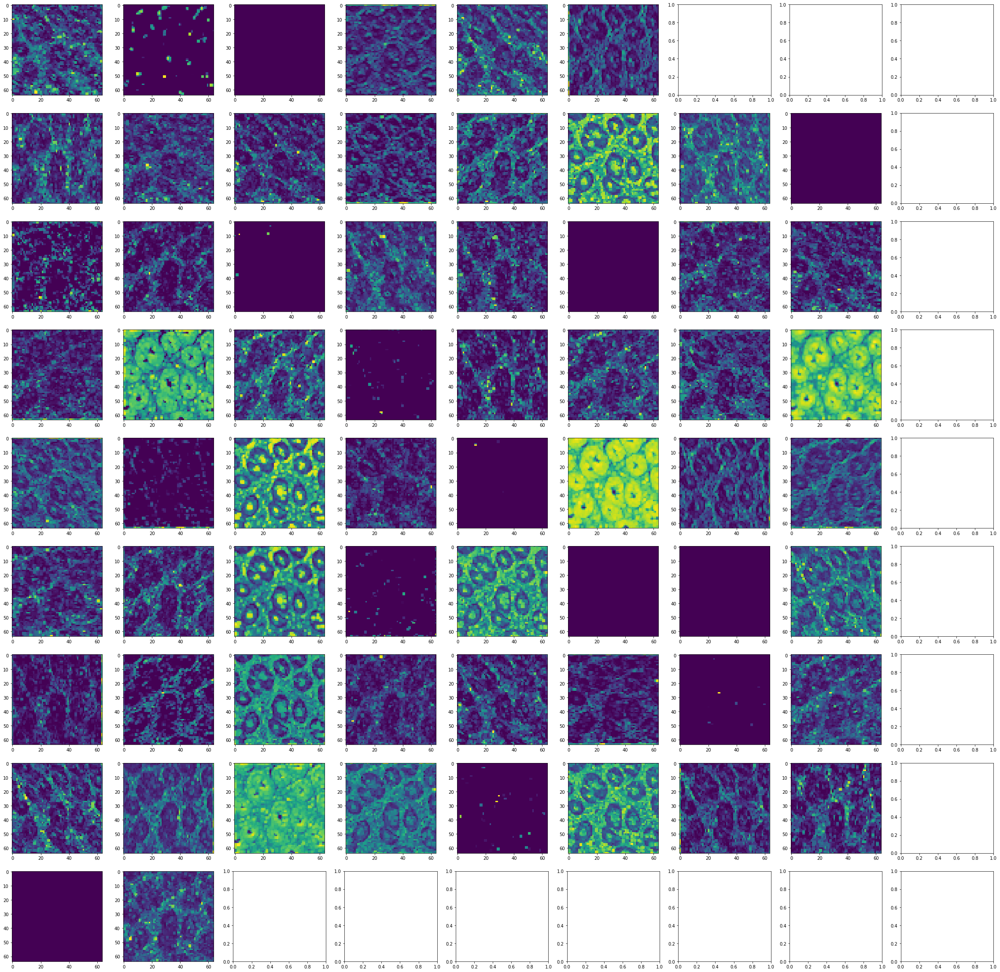

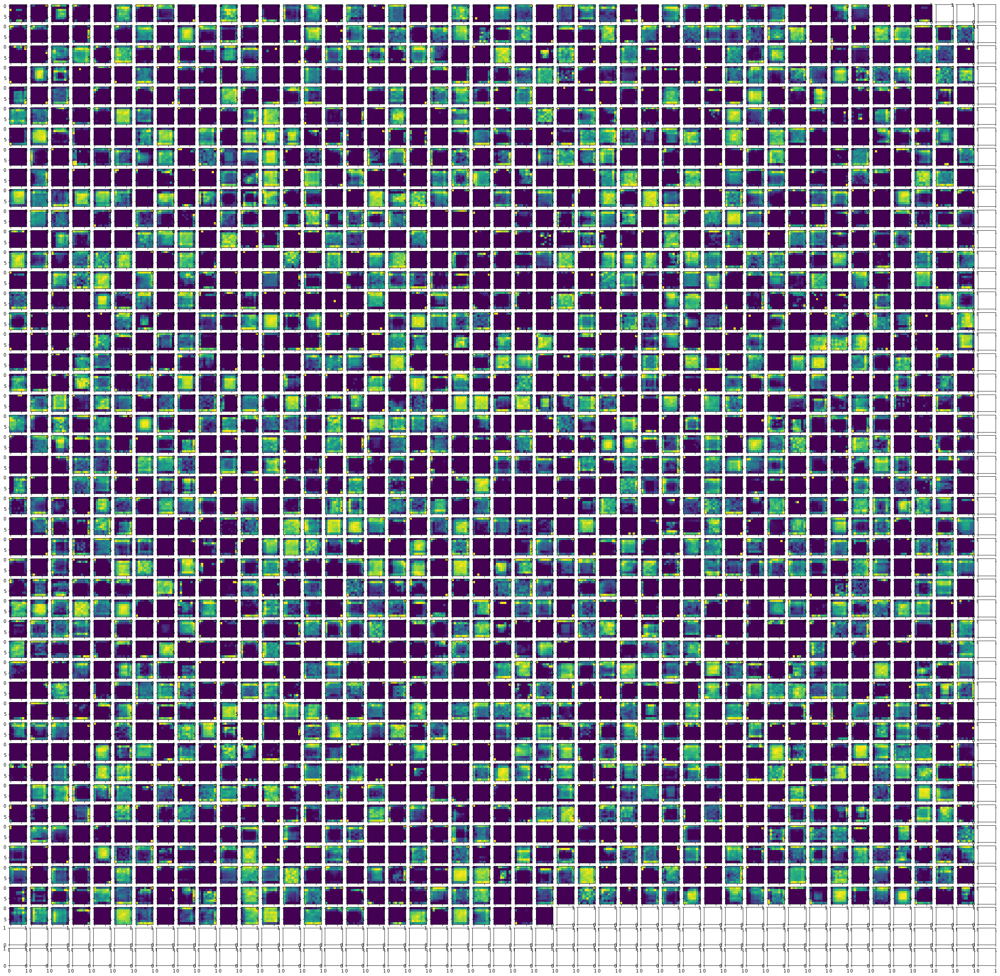

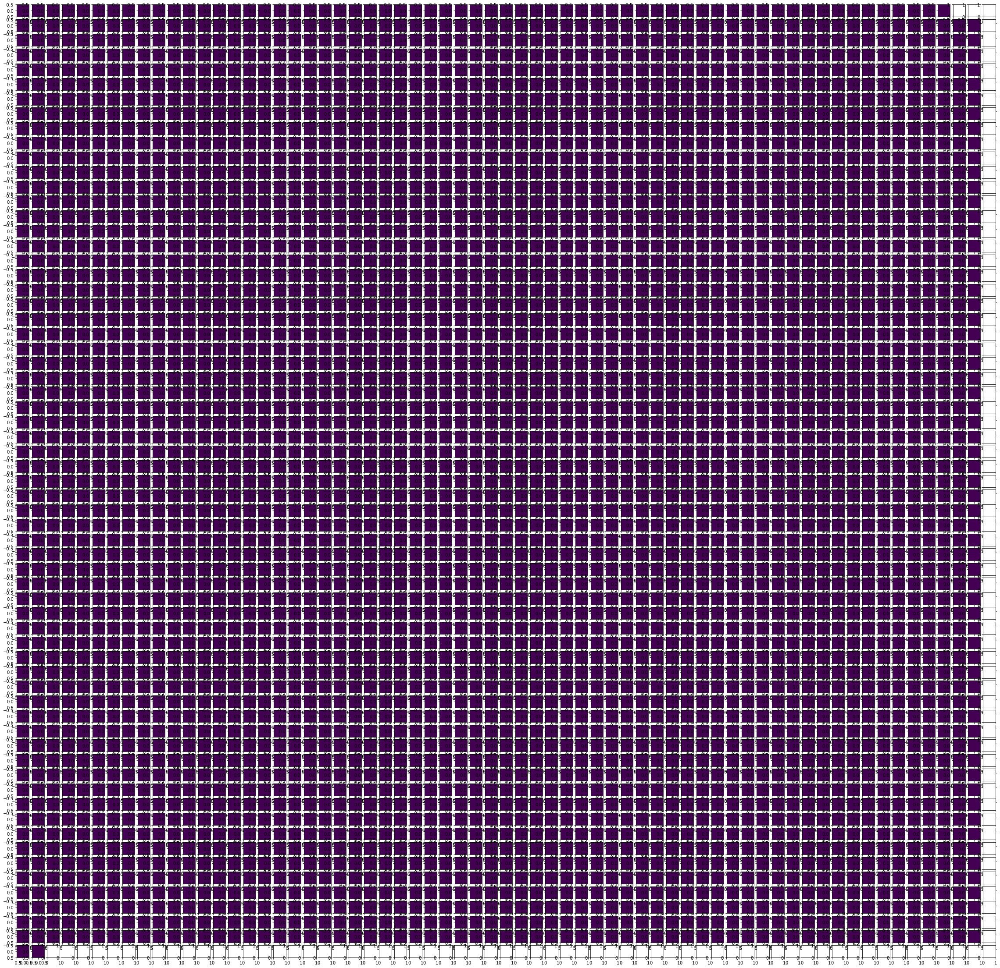

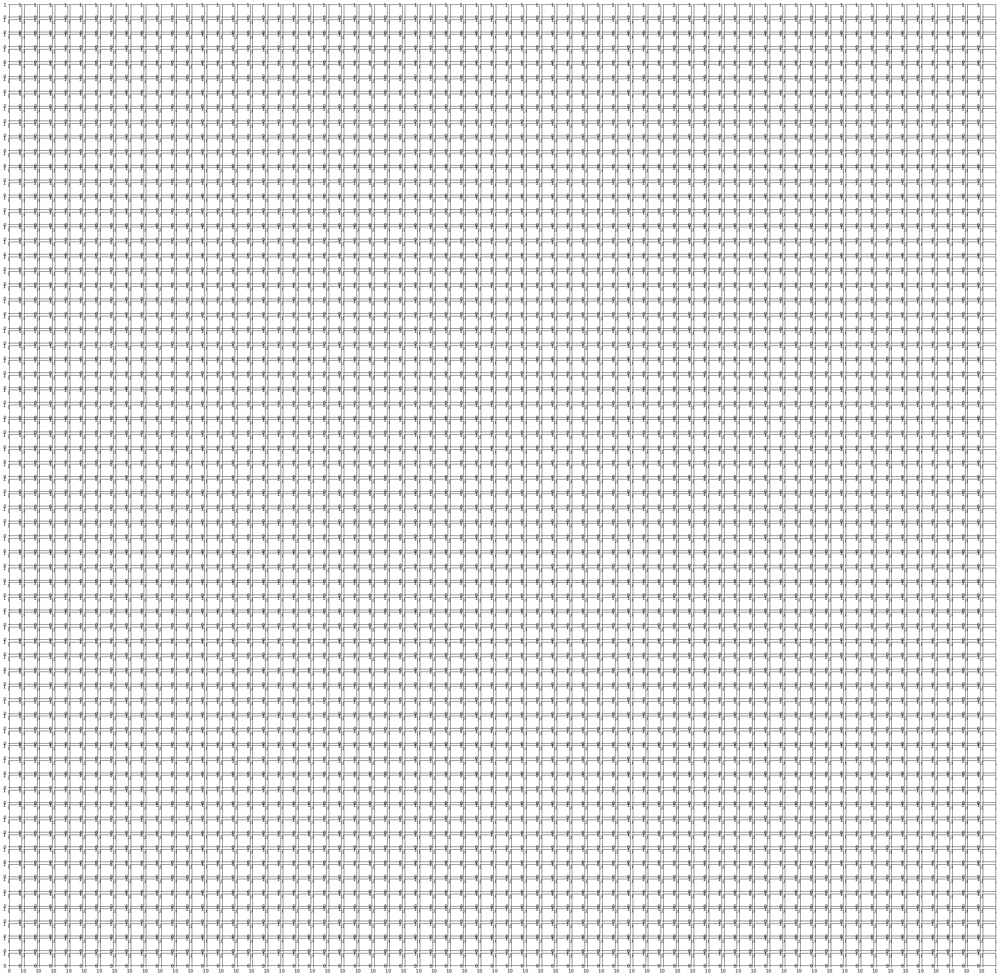

In [64]:
visulaize_layers(layer_outputs)